<br><br>

<p style="color:red; font-size:1.3em;">종종 Jupyter notebook에서 <b>Kernel Dead</b> 메시지가 뜨면서 강제로 kernel이 종료될 수 있습니다.</p><br>
<p style="font-size:1.3em;">이 현상은 이미지 파일 등을 처리할 때 컴퓨터의 메모리 부족 등의 이유로 발생할 수 있으며,<br><br>
만일 Kernel Dead 메시지가 뜨면 <span style="color:red;"> <b>다시 첫번째 Cell부터 실행하며 내려가다가 해당 Cell을 제외하고 실행</b>시켜주세요!</span></p>
    
<br><br>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm

import torch
from torch import nn

from torch.utils.data import DataLoader # class for loading the dataset (Dataset -> Batches)
from torchmetrics import Accuracy
from torchinfo import summary

import torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder # Load "Image" data from selected "Folder"s

print(torch.__version__)
print(torchvision.__version__)

2.3.1
0.18.1


/opt/anaconda3/envs/goormthon/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<br>
<br>

# 1. Prepare the dataset
<br>

### * Original Dataset : **Food-101** @ https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/

<br>

- **101** food categories<br>
- **101,000** images<br>
- **750** training images & **250** test images per class<br>
- rescaled to have a **maximum side length of 512 pixels**

In [2]:
import zipfile
import os
import glob
import random

In [3]:
with zipfile.ZipFile("data_food101/Food101.zip", "r") as zip_f:
    
    print("Unzipping the dataset.") 
    
    zip_f.extractall("data_food101/data") # "extract" "all" files 

Unzipping the dataset.


In [4]:
for dir_path, dir_names, file_names in os.walk("data_food101/data"): # 지정된 디렉토리 내부를 거닐며("walk") 조회
    
    if len(dir_names) == 3:
        print('--------------------------------')
    
    print("There are {} directories and {} images in '{}'.".format(len(dir_names), len(file_names), dir_path))

There are 2 directories and 1 images in 'data_food101/data'.
--------------------------------
There are 3 directories and 1 images in 'data_food101/data/test'.
There are 0 directories and 19 images in 'data_food101/data/test/steak'.
There are 0 directories and 31 images in 'data_food101/data/test/sushi'.
There are 0 directories and 25 images in 'data_food101/data/test/pizza'.
--------------------------------
There are 3 directories and 0 images in 'data_food101/data/train'.
There are 0 directories and 75 images in 'data_food101/data/train/steak'.
There are 0 directories and 72 images in 'data_food101/data/train/sushi'.
There are 0 directories and 78 images in 'data_food101/data/train/pizza'.


In [5]:
TRAIN_DIR = "data_food101/data/train"
TEST_DIR  = "data_food101/data/test"

<br>
<br>

# 2. Prepare the **Data-augmentation** 

<br>

### 1) Basic usage of **torchvision.transforms.Compose**

In [31]:
# from torchvision import transforms

In [6]:
# torchvision.transforms.ToTensor()는 pixel 값들을 [ 0~255 ] 에서 [ 0.0~1.0 ]으로 자동 변환합니다. @ https://bit.ly/3gpqIn0

IMG_TRANSFORM = transforms.Compose([ # "구성하다"(compose)
    
    transforms.Resize(size=(64, 64)), # image resize
    transforms.RandomHorizontalFlip(p=0.5), # Filp the image horizontally (p = probability of flip)
    transforms.ToTensor()                   # (Original) PIL format -> PyTorch tensors 

])

In [50]:
# # https://pytorch.org/vision/stable/transforms.html
# # https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#illustration-of-transforms

# for name in dir(transforms):
#     if '_' not in name:
#         print(name)

In [7]:
# random_tensor = torch.rand(size=(2, 3, 5))

# print(random_tensor.shape)

# random_tensor = random_tensor.permute(1, 2, 0) # 각 차원의 순서를 변경하여 재배치 : [0, 1, 2] -> [1, 2, 0]

# print(random_tensor.shape)

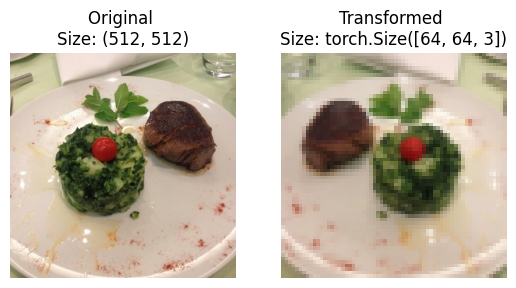

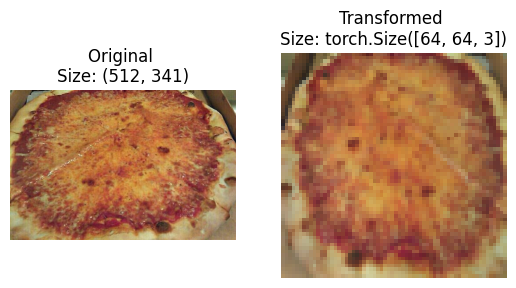

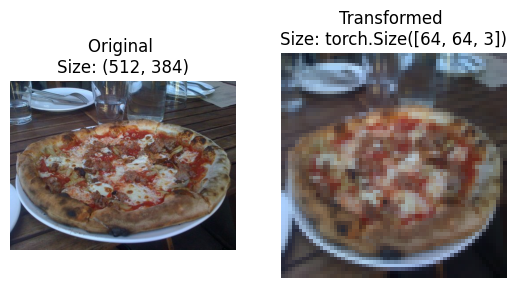

In [8]:
train_images = glob.glob("data_food101/data/train/*/*.jpg")

random_img_3 = random.sample(train_images, k=3)

for rand_img in random_img_3:
    with Image.open(rand_img) as img:
        
        fig, ax = plt.subplots(1, 2)
        
        ax[0].imshow(img) 
        ax[0].set_title("Original \nSize: {}".format(img.size))
        ax[0].axis("off")

        # PyTorch's    default image shape == [ Channels, Height, Width ]
        # Matplotlib's default image shape == [ Height, Width, Channels ]
        img_transformed = IMG_TRANSFORM(img).permute(1, 2, 0) 
        
        ax[1].imshow(img_transformed) 
        ax[1].set_title("Transformed \nSize: {}".format(img_transformed.shape))
        ax[1].axis("off")

<br>

### 2) Automatic augmentation transform - **TrivialAugment**

####  * Automatic augmentation transforms generally perform **better than hand-picked transforms**.<br><br> -> Various automatic augmentation transforms are available. @ https://bit.ly/3tTZs3a
<br>

- AutoAugment
- RandAugment
- TrivialAugmentWide
- AugMix

<br>

In [9]:
torchvision.transforms.TrivialAugmentWide(num_magnitude_bins=31)

TrivialAugmentWide(num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)

<hr>
<br>

#### - “TrivialAugment: Tuning-free Yet State-of-the-Art Data Augmentation (2021)” (https://bit.ly/3VCxRPZ)
<br>

#### - Tuning의 필요성이 적으나 성능이 좋은 Automatic augmentation 기법
<br>

#### - 매 batch마다 **정해진 Transform set 중 랜덤하게 1 종류의 transform** 선택 (https://bit.ly/3EsTBGZ -> _augmentation_space )
<br>

#### - 해당 **operation을 적용하는 강도(intensity)는 0~30 사이의 magnitude 값으로 조정** 
<br>

#### - **num_magnitude_bins** : 선택된 transform의 **적용 강도(intensity) 값을 랜덤하게 결정하기 위한 범위**를 지정
- num_magnitude_bins = 0  : **no range**
- num_magnitude_bins = 31  : **maximum range** (가장 높은 intensity 값으로 결정될 가능성이 가장 높음)

<br>
<hr>

In [10]:
# torchvision.transforms.ToTensor()는 pixel 값들을 [ 0~255 ] 에서 [ 0.0~1.0 ]으로 자동 변환합니다. @ https://bit.ly/3gpqIn0

TRAIN_TRANSFORM = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.TrivialAugmentWide(num_magnitude_bins=31), # maximum (가장 높은 intensity 값으로 결정될 가능성이 가장 높음)
    transforms.ToTensor() # (Original) PIL format -> PyTorch tensors 
])

# Test 데이터에 대해서는 Augmentation을 적용하지 않습니다.
TEST_TRANSFORM = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor() # (Original) PIL format -> PyTorch tensors 
])

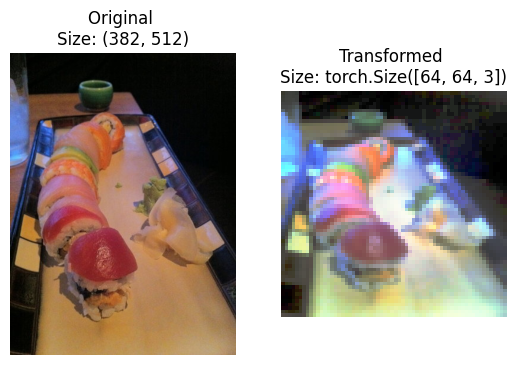

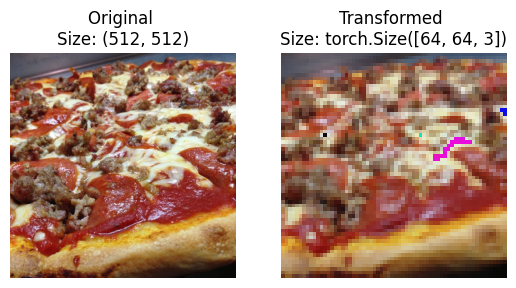

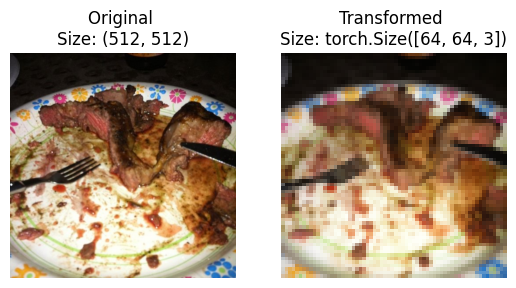

In [14]:
# train_images = glob.glob("data_food101/data/train/*/*.jpg")

random_img_3 = random.sample(train_images, k=3)

for rand_img in random_img_3:
    with Image.open(rand_img) as img:
        
        fig, ax = plt.subplots(1, 2)
        
        ax[0].imshow(img) 
        ax[0].set_title("Original \nSize: {}".format(img.size))
        ax[0].axis("off")

        # PyTorch's    default image shape == [ Channels, Height, Width ]
        # Matplotlib's default image shape == [ Height, Width, Channels ]
        img_transformed = TRAIN_TRANSFORM(img).permute(1, 2, 0) 
        
        ax[1].imshow(img_transformed) 
        ax[1].set_title("Transformed \nSize: {}".format(img_transformed.shape))
        ax[1].axis("off")

<br>
<br>

# 3. Prepare the **DataLoader** - Using [ torchvision.datasets.**ImageFolder** ]

### 1) **image directories** -> **image transformation** ->  **ImageFolder** (== flow_from_directory) 

In [68]:
# from torchvision.datasets import ImageFolder

In [15]:
train_imgfolder = ImageFolder(root=TRAIN_DIR,
                              transform=TRAIN_TRANSFORM, # torchvision.transforms.Compose
                              target_transform=None)   # we can transform labels, too (if it is needed)

test_imgfolder  = ImageFolder(root=TEST_DIR,
                              transform=TEST_TRANSFORM)

print(train_imgfolder, '\n')
print(test_imgfolder)

Dataset ImageFolder
    Number of datapoints: 225
    Root location: data_food101/data/train
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
               TrivialAugmentWide(num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)
               ToTensor()
           ) 

Dataset ImageFolder
    Number of datapoints: 75
    Root location: data_food101/data/test
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
           )


In [16]:
train_imgfolder.classes # automatically extracted from the names of directories

['pizza', 'steak', 'sushi']

In [17]:
train_imgfolder[0]

(tensor([[[0.0392, 0.0392, 0.0392,  ..., 0.0314, 0.0314, 0.0353],
          [0.0431, 0.0431, 0.0431,  ..., 0.0314, 0.0314, 0.0353],
          [0.0431, 0.0431, 0.0431,  ..., 0.0314, 0.0314, 0.0314],
          ...,
          [0.0549, 0.0549, 0.0549,  ..., 0.0392, 0.0353, 0.0353],
          [0.0549, 0.0549, 0.0549,  ..., 0.0353, 0.0314, 0.0275],
          [0.0549, 0.0549, 0.0549,  ..., 0.0314, 0.0275, 0.0275]],
 
         [[0.0196, 0.0196, 0.0196,  ..., 0.0235, 0.0235, 0.0235],
          [0.0196, 0.0196, 0.0196,  ..., 0.0235, 0.0235, 0.0235],
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0235, 0.0235],
          ...,
          [0.0784, 0.0784, 0.0824,  ..., 0.0431, 0.0431, 0.0392],
          [0.0784, 0.0784, 0.0824,  ..., 0.0392, 0.0392, 0.0353],
          [0.0745, 0.0784, 0.0824,  ..., 0.0353, 0.0353, 0.0314]],
 
         [[0.0039, 0.0039, 0.0039,  ..., 0.0275, 0.0275, 0.0314],
          [0.0039, 0.0039, 0.0039,  ..., 0.0275, 0.0275, 0.0275],
          [0.0039, 0.0039, 0.0039,  ...,

In [18]:
train_imgfolder.class_to_idx

{'pizza': 0, 'steak': 1, 'sushi': 2}

In [19]:
img   = train_imgfolder[0][0]
label = train_imgfolder[0][1]

<class 'torch.Tensor'>
torch.Size([3, 64, 64])
torch.float32
0


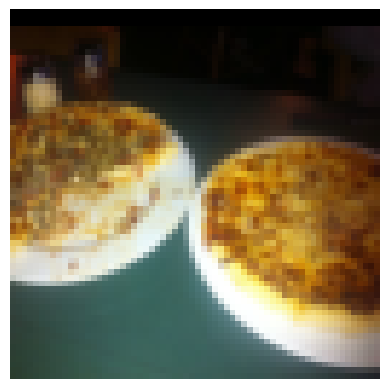

In [20]:
print(type(img))
print(img.shape) # after the data-augmentation
print(img.dtype)
print(label)

plt.imshow(img.permute(1, 2, 0))
plt.axis("off")
plt.show()

### 2) **ImageFolder** -> **DataLoader** (iterable for mini-batches)

In [ ]:
# from torch.utils.data import DataLoader

In [21]:
os.cpu_count() # the total number of CPUs on the current machine

8

In [22]:
torch.manual_seed(42)

train_dataloader = DataLoader(dataset=train_imgfolder, 
                              batch_size=32, 
                              num_workers=os.cpu_count(), # number of subprocesses to use for data loading
                              shuffle=True)

test_dataloader  = DataLoader(dataset=test_imgfolder, 
                              batch_size=32, 
                              num_workers=os.cpu_count(), 
                              shuffle=False)

In [23]:
# A set of batch-data

batch_x, batch_y = next(iter(train_dataloader))

In [24]:
batch_x.shape

torch.Size([32, 3, 64, 64])

In [25]:
batch_y.shape

torch.Size([32])

<class 'torch.Tensor'>
torch.Size([3, 64, 64])
torch.float32


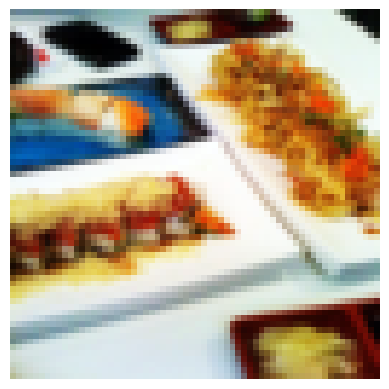

In [26]:
image_sample = batch_x[0]

print(type(image_sample))
print(image_sample.shape) # after the data-augmentation
print(image_sample.dtype)

plt.imshow(image_sample.permute(1, 2, 0))
plt.axis("off")
plt.show()

### Summary

In [ ]:
# # 1) image directories -> image transformation -> ImageFolder

# TRAIN_DIR = "data_food101/data/train"
# TEST_DIR  = "data_food101/data/test"

# TRAIN_TRANSFORM = transforms.Compose([
#     transforms.Resize((64, 64)),
#     transforms.TrivialAugmentWide(num_magnitude_bins=31), 
#     transforms.ToTensor() 
# ])
# TEST_TRANSFORM = transforms.Compose([
#     transforms.Resize((64, 64)),
#     transforms.ToTensor()
# ])

# train_imgfolder = ImageFolder(root=TRAIN_DIR, transform=TRAIN_TRANSFORM)
# test_imgfolder  = ImageFolder(root=TEST_DIR,  transform=TEST_TRANSFORM)


# # 2) ImageFolder -> DataLoader (iterable for mini-batches)

# torch.manual_seed(42)

# train_dataloader = DataLoader(dataset=train_imgfolder, 
#                               batch_size=32, 
#                               num_workers=os.cpu_count(),
#                               shuffle=True)

# test_dataloader  = DataLoader(dataset=test_imgfolder, 
#                               batch_size=32, 
#                               num_workers=os.cpu_count(), 
#                               shuffle=False)

<br>
<br>

# 4. Build the model - CNN **with** data-augmentation

In [27]:
class CNNAugment_TinyVGG(nn.Module): # should inherit the class nn.Module
    
    
    def __init__(self, num_channels, num_filters, num_classes): 
        
        super().__init__()
        
        
        self.conv_block_entrance = nn.Sequential(
            
            nn.Conv2d(in_channels=num_channels, # will be '3' == R/G/B
                      out_channels=num_filters, # num_filters == num of feature-maps == num of output channels
                      kernel_size=(3, 3), 
                      stride=1,                 # default
                      padding=1),               # 0 == 'valid', 1 == 'same'
            nn.BatchNorm2d(num_filters),        # Batch-normalization on 2-Dimensional data
            nn.ReLU(),
            
            nn.Conv2d(in_channels=num_filters,  # should be same as the number of "channels of previous output"
                      out_channels=num_filters,
                      kernel_size=(3, 3),
                      stride=1,
                      padding=1),
            nn.BatchNorm2d(num_filters),        # Batch-normalization 
            nn.ReLU(),
            
            nn.MaxPool2d(kernel_size=2, stride=2) # Default == kernel_size (자동으로 지정됨)
        )
        # [ 32, 3, 64, 64 ] -> [ 32, 10, 32, 32 ]
        
        
        self.conv_block_hidden_1 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters, (3, 3), padding=1),
            nn.BatchNorm2d(num_filters), # Batch-normalization 
            nn.ReLU(),
            nn.Conv2d(num_filters, num_filters, (3, 3), padding=1),
            nn.BatchNorm2d(num_filters), # Batch-normalization 
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        # [ 32, 10, 32, 32 ] -> [ 32, 10, 16, 16 ]
        
        
        self.conv_block_hidden_2 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters, (3, 3), padding=1),
            nn.BatchNorm2d(num_filters), # Batch-normalization 
            nn.ReLU(),
            nn.Conv2d(num_filters, num_filters, (3, 3), padding=1),
            nn.BatchNorm2d(num_filters), # Batch-normalization 
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        # [ 32, 10, 16, 16 ] -> [ 32, 10, 8, 8 ]
        
        
        self.classifier_block = nn.Sequential(
            nn.Flatten(), # Flatten the input data
            nn.Dropout(0.5), # Drop-out
            nn.Linear(in_features=num_filters * 8 * 8, 
                      out_features=num_filters * 16 * 16),
            nn.ReLU(),
            nn.Dropout(0.5), # Drop-out
            nn.Linear(in_features=num_filters * 16 * 16, 
                      out_features=num_classes)
        )
        # [ 32, 10, 8, 8 ] -> [ 32, 10 * 8 * 8 ] -> [ 32, 10 * 16 * 16 ] -> [ 32, 10 ]
    
    
    def forward(self, x):
        
        x = self.conv_block_entrance(x)
        # print(x.shape)
        
        x = self.conv_block_hidden_1(x)
        # print(x.shape)
        
        x = self.conv_block_hidden_2(x)
        # print(x.shape)
        
        x = self.classifier_block(x)
        # print(x.shape)
        
        # 아래와 같이 코드를 작성하게되면 메모리가 크게 소요되는 변수 재할당 과정이 생략되므로 계산 속도가 향상됩니다. (https://bit.ly/3V16ZJy)
        # return self.classifier_block(conv_block_hidden_2(conv_block_hidden_1(conv_block_entrance(x)))
        
        return x

<br>
<br>

# 5.  Train the model

In [28]:
device = "mps" if torch.backends.mps.is_available() else "cpu" # "cuda"가 사용 가능하다면 (if it "is available")

device

'mps'

<br>

### 1) Initialize the model

In [29]:
torch.manual_seed(42)

model = CNNAugment_TinyVGG(num_channels=3, # R / G / B
                           num_filters=32, # number of filters == number of feature-maps
                           num_classes=3   # Pizza / Steak / Sushi
                          ).to(device)
    
model

CNNAugment_TinyVGG(
  (conv_block_entrance): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_hidden_1): Sequential(
    (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_blo

In [116]:
# # 모델 내에서의 Shape 변화를 확인하고 싶을 경우 forward 함수 내 주석 해제 후 아래 코드를 실행해주세요.

# temp_batch_x = next(iter(train_dataloader))[0]

# print(temp_batch_x.shape)

# model(temp_batch_x)

<br>

### 2) Check the model before training

In [30]:
batch_x, batch_y = next(iter(train_dataloader))

sample_label = batch_y[0]

sample_img = batch_x[0]
print(sample_img.shape)

sample_img = sample_img.reshape(1, 3, 64, 64)
print(sample_img.shape, '\n')


model.eval()

with torch.inference_mode():
    logits = model(sample_img.to(device))

    
print(logits)

print(logits.softmax(dim=1)) # 행 방향 Softmax 적용

print(logits.softmax(dim=1).argmax(dim=1)[0]) # 행 방향 Softmax & argmax 적용

print(sample_label)

torch.Size([3, 64, 64])
torch.Size([1, 3, 64, 64]) 

tensor([[-0.0016,  0.0037, -0.0134]], device='mps:0')
tensor([[0.3340, 0.3358, 0.3301]], device='mps:0')
tensor(1, device='mps:0')
tensor(1)


In [31]:
# from torchinfo import summary

summary(model, input_size=[32, 3, 64, 64])

Layer (type:depth-idx)                   Output Shape              Param #
CNNAugment_TinyVGG                       [32, 3]                   --
├─Sequential: 1-1                        [32, 32, 32, 32]          --
│    └─Conv2d: 2-1                       [32, 32, 64, 64]          896
│    └─BatchNorm2d: 2-2                  [32, 32, 64, 64]          64
│    └─ReLU: 2-3                         [32, 32, 64, 64]          --
│    └─Conv2d: 2-4                       [32, 32, 64, 64]          9,248
│    └─BatchNorm2d: 2-5                  [32, 32, 64, 64]          64
│    └─ReLU: 2-6                         [32, 32, 64, 64]          --
│    └─MaxPool2d: 2-7                    [32, 32, 32, 32]          --
├─Sequential: 1-2                        [32, 32, 16, 16]          --
│    └─Conv2d: 2-8                       [32, 32, 32, 32]          9,248
│    └─BatchNorm2d: 2-9                  [32, 32, 32, 32]          64
│    └─ReLU: 2-10                        [32, 32, 32, 32]          --
│    └─C

<br>

### 3) Make train & test step as separate functions

In [32]:
def train_step(model, dataloader, loss_fn, optimizer, metric, device):
    
    # 모델을 training mode로 설정 (default state)
    model.train()
    
    # train-loss & train-accuracy for one epoch
    train_loss = 0
    train_acc  = 0
    
    for batch_idx, (X, y) in enumerate(dataloader): # get an item from DataLoader with it's index number
        
        X = X.to(device)
        y = y.to(device)
        
        # 1. (x 데이터를 모델에 넣고) 순방향 계산 진행 (forward pass)
        logits = model(X)

        # 2. (Batch) Training cost 계산 (Cost function 계산)
        loss = loss_fn(logits, y) # cost of batch <- nn.CrossEntropyLoss() : built-in Softmax
        train_loss += loss.item()
        
        # 3. Optimizer 내부의 이전 gradient 값 초기화 (Make "grad" to "zero")
        optimizer.zero_grad()

        # 4. Back-propagation ("Backward" propagation)
        loss.backward()

        # 5. Gradient descent 진행 (Take a "step" to update parameters)
        optimizer.step()

        # 6. (Batch) Training accuracy 계산 
        predicted_classes = logits.softmax(dim=1).argmax(dim=1)
        train_acc += metric(predicted_classes, y).item() # calculate the batch accuracy & add to the epoch accuracy

    
    # Batch 순회 종료 후
    train_loss = train_loss / len(dataloader) # cost of batches / num of batches (calculate average)
    train_acc  = train_acc  / len(dataloader) # acc  of batches / num of batches (calculate average)
    
    return train_loss, train_acc

In [33]:
def test_step(model, dataloader, loss_fn, metric, device):
    
    # 모델을 evaluation mode로 설정
    model.eval() 
    
    # test-loss & test-accuracy for one epoch
    test_loss = 0
    test_acc  = 0
    
    with torch.inference_mode(): # Set "inference mode"
        
        for batch_idx, (X, y) in enumerate(dataloader): # X & y == a single batch
            
            X = X.to(device)
            y = y.to(device)
    
            # 1. (x 데이터를 모델에 넣고) 순방향 계산 진행 (forward pass)
            logits = model(X)

            # 2. (Batch) Test cost 계산 (Cost function 계산)
            loss = loss_fn(logits, y) # cost of batch <- nn.CrossEntropyLoss() : built-in Softmax
            test_loss += loss.item()

            # 3. (Batch) Test accuracy 계산 
            predicted_classes = logits.softmax(dim=1).argmax(dim=1)
            test_acc += metric(predicted_classes, y).item() # calculate the batch accuracy & add to the epoch accuracy

    
    # Batch 순회 종료 후
    test_loss = test_loss / len(dataloader) # cost of batches / num of batches (calculate average)
    test_acc  = test_acc  / len(dataloader) # acc  of batches / num of batches (calculate average)
    
    return test_loss, test_acc

<br>

### 4) Combine train & test step into a simplified "train" function 

In [34]:
def train(model, 
          train_dataloader, test_dataloader, 
          optimizer, loss_fn, metric, 
          device, epochs=5):
    
    
    results = {"train_loss": [], 
               "train_acc" : [], 
               "test_loss" : [], 
               "test_acc"  : []}
    
    
    for epoch in tqdm(range(epochs)): # from tqdm.auto import tqdm
        
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn, 
                                           optimizer=optimizer, 
                                           metric=metric, 
                                           device=device)
        
        test_loss, test_acc   = test_step(model=model,
                                          dataloader=test_dataloader, 
                                          loss_fn=loss_fn, 
                                          metric=metric, 
                                          device=device)
        
        
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
        
        
        print('Epoch : {} | Train_loss : {} | Train_acc : {} | Test_loss : {} | Test_acc : {}'.format(epoch+1, 
                                                                                                      train_loss, 
                                                                                                      train_acc, 
                                                                                                      test_loss, 
                                                                                                      test_acc))
    
    return results

<br>

### 5) Train the model & Check the result

In [35]:
torch.manual_seed(42)

model = CNNAugment_TinyVGG(num_channels=3, # R / G / B
                           num_filters=32, # number of filters == number of feature-maps
                           num_classes=3   # Pizza / Steak / Sushi
                          ).to(device)

In [36]:
loss_fn = nn.CrossEntropyLoss() # Softmax + CrossEntropy (built-in Softmax)

optimizer = torch.optim.Adam(params=model.parameters(), # "parameters" to optimize (apply gradient descent)
                             lr=0.001)                  # "l"earning "r"ate 
    
metric_accuracy = Accuracy(task='multiclass',
                           num_classes=3).to(device) # from torchmetrics import Accuracy

In [37]:
from timeit import default_timer as timer

START_TIME = timer()

NUM_EPOCHS = 30

model_results = train(model=model, 
                      train_dataloader=train_dataloader,
                      test_dataloader=test_dataloader,
                      optimizer=optimizer,
                      loss_fn=loss_fn, 
                      metric=metric_accuracy,
                      device=device,
                      epochs=NUM_EPOCHS)

END_TIME = timer()

print('Training time : {} seconds'.format(round(END_TIME-START_TIME, 2)))

  3%|▎         | 1/30 [01:00<29:10, 60.35s/it]

Epoch : 1 | Train_loss : 6.374273847788572 | Train_acc : 0.3984375 | Test_loss : 1.116745154062907 | Test_acc : 0.2604166666666667


  7%|▋         | 2/30 [01:59<27:57, 59.92s/it]

Epoch : 2 | Train_loss : 2.2224126756191254 | Train_acc : 0.26953125 | Test_loss : 1.233423113822937 | Test_acc : 0.19791666666666666


 10%|█         | 3/30 [02:59<26:55, 59.83s/it]

Epoch : 3 | Train_loss : 1.1792554706335068 | Train_acc : 0.44140625 | Test_loss : 1.1102184851964314 | Test_acc : 0.2604166666666667


 13%|█▎        | 4/30 [04:00<26:02, 60.08s/it]

Epoch : 4 | Train_loss : 1.310824990272522 | Train_acc : 0.33984375 | Test_loss : 1.0066673159599304 | Test_acc : 0.4943181872367859


 17%|█▋        | 5/30 [04:59<24:57, 59.89s/it]

Epoch : 5 | Train_loss : 1.00152831338346 | Train_acc : 0.50390625 | Test_loss : 1.0660195350646973 | Test_acc : 0.3125


 20%|██        | 6/30 [05:59<23:58, 59.94s/it]

Epoch : 6 | Train_loss : 1.093118667602539 | Train_acc : 0.421875 | Test_loss : 1.0070047775904338 | Test_acc : 0.4753787914911906


 23%|██▎       | 7/30 [06:59<22:58, 59.94s/it]

Epoch : 7 | Train_loss : 1.27286709100008 | Train_acc : 0.46484375 | Test_loss : 0.9329891204833984 | Test_acc : 0.5056818226973215


 27%|██▋       | 8/30 [07:59<21:58, 59.94s/it]

Epoch : 8 | Train_loss : 1.0029086545109749 | Train_acc : 0.546875 | Test_loss : 1.0666902263959248 | Test_acc : 0.38446969787279767


 30%|███       | 9/30 [08:59<20:58, 59.93s/it]

Epoch : 9 | Train_loss : 0.9737383127212524 | Train_acc : 0.4765625 | Test_loss : 1.0327301621437073 | Test_acc : 0.4753787914911906


 33%|███▎      | 10/30 [09:59<19:57, 59.90s/it]

Epoch : 10 | Train_loss : 1.1542539224028587 | Train_acc : 0.51171875 | Test_loss : 1.0186569293340046 | Test_acc : 0.40340909361839294


 37%|███▋      | 11/30 [10:59<18:57, 59.88s/it]

Epoch : 11 | Train_loss : 0.9862331748008728 | Train_acc : 0.5390625 | Test_loss : 0.955961267153422 | Test_acc : 0.5776515205701193


 40%|████      | 12/30 [11:59<17:57, 59.87s/it]

Epoch : 12 | Train_loss : 0.9976169671863317 | Train_acc : 0.59375 | Test_loss : 1.0082668264706929 | Test_acc : 0.4952651560306549


 43%|████▎     | 13/30 [12:58<16:58, 59.89s/it]

Epoch : 13 | Train_loss : 1.2350555434823036 | Train_acc : 0.4609375 | Test_loss : 1.0890643795331318 | Test_acc : 0.3636363645394643


 47%|████▋     | 14/30 [13:59<15:59, 59.96s/it]

Epoch : 14 | Train_loss : 1.1462479159235954 | Train_acc : 0.5859375 | Test_loss : 0.9446764985720316 | Test_acc : 0.5965909163157145


 50%|█████     | 15/30 [14:58<14:59, 59.93s/it]

Epoch : 15 | Train_loss : 1.1915191635489464 | Train_acc : 0.5703125 | Test_loss : 1.006727437178294 | Test_acc : 0.5378787914911906


 53%|█████▎    | 16/30 [15:59<13:59, 59.97s/it]

Epoch : 16 | Train_loss : 1.0529961213469505 | Train_acc : 0.52734375 | Test_loss : 0.9077458381652832 | Test_acc : 0.5359848539034525


 57%|█████▋    | 17/30 [16:58<12:59, 59.95s/it]

Epoch : 17 | Train_loss : 0.9907035455107689 | Train_acc : 0.57421875 | Test_loss : 1.077502191066742 | Test_acc : 0.5369318226973215


 60%|██████    | 18/30 [17:58<11:58, 59.92s/it]

Epoch : 18 | Train_loss : 1.183029793202877 | Train_acc : 0.46875 | Test_loss : 1.1080458164215088 | Test_acc : 0.4261363645394643


 63%|██████▎   | 19/30 [18:58<10:59, 59.96s/it]

Epoch : 19 | Train_loss : 1.0527732521295547 | Train_acc : 0.52734375 | Test_loss : 0.9795429905255636 | Test_acc : 0.4753787914911906


 67%|██████▋   | 20/30 [19:58<09:59, 59.92s/it]

Epoch : 20 | Train_loss : 0.9324842914938927 | Train_acc : 0.484375 | Test_loss : 0.9717785914738973 | Test_acc : 0.5369318226973215


 70%|███████   | 21/30 [20:58<08:59, 59.91s/it]

Epoch : 21 | Train_loss : 0.9130105376243591 | Train_acc : 0.51953125 | Test_loss : 0.8951980074246725 | Test_acc : 0.5160984893639883


 73%|███████▎  | 22/30 [21:59<08:01, 60.15s/it]

Epoch : 22 | Train_loss : 0.875742832198739 | Train_acc : 0.62109375 | Test_loss : 0.9574638605117798 | Test_acc : 0.48674242695172626


 77%|███████▋  | 23/30 [22:59<07:00, 60.05s/it]

Epoch : 23 | Train_loss : 0.811024125199765 | Train_acc : 0.6328125 | Test_loss : 1.3391222755114238 | Test_acc : 0.44602272907892865


 80%|████████  | 24/30 [23:59<06:00, 60.02s/it]

Epoch : 24 | Train_loss : 1.3190194517374039 | Train_acc : 0.55078125 | Test_loss : 0.8872213761011759 | Test_acc : 0.5369318226973215


 83%|████████▎ | 25/30 [24:58<04:59, 59.93s/it]

Epoch : 25 | Train_loss : 1.4340432286262512 | Train_acc : 0.46484375 | Test_loss : 1.1294193665186565 | Test_acc : 0.40435606241226196


 87%|████████▋ | 26/30 [25:58<03:59, 59.93s/it]

Epoch : 26 | Train_loss : 1.079235352575779 | Train_acc : 0.45703125 | Test_loss : 1.1842466195424397 | Test_acc : 0.44507576028505963


 90%|█████████ | 27/30 [26:58<02:59, 59.92s/it]

Epoch : 27 | Train_loss : 1.0878763496875763 | Train_acc : 0.37890625 | Test_loss : 1.3087232907613118 | Test_acc : 0.40340909361839294


 93%|█████████▎| 28/30 [27:58<01:59, 59.90s/it]

Epoch : 28 | Train_loss : 1.0039858594536781 | Train_acc : 0.4765625 | Test_loss : 1.2224367062250774 | Test_acc : 0.41382576028505963


 97%|█████████▋| 29/30 [28:58<00:59, 59.98s/it]

Epoch : 29 | Train_loss : 0.9240578636527061 | Train_acc : 0.625 | Test_loss : 0.9126426577568054 | Test_acc : 0.5672348539034525


100%|██████████| 30/30 [29:58<00:00, 59.96s/it]

Epoch : 30 | Train_loss : 0.7885378859937191 | Train_acc : 0.73046875 | Test_loss : 1.1631931066513062 | Test_acc : 0.4337121248245239
Training time : 1798.9 seconds


In [38]:
model_results

{'train_loss': [6.374273847788572,
  2.2224126756191254,
  1.1792554706335068,
  1.310824990272522,
  1.00152831338346,
  1.093118667602539,
  1.27286709100008,
  1.0029086545109749,
  0.9737383127212524,
  1.1542539224028587,
  0.9862331748008728,
  0.9976169671863317,
  1.2350555434823036,
  1.1462479159235954,
  1.1915191635489464,
  1.0529961213469505,
  0.9907035455107689,
  1.183029793202877,
  1.0527732521295547,
  0.9324842914938927,
  0.9130105376243591,
  0.875742832198739,
  0.811024125199765,
  1.3190194517374039,
  1.4340432286262512,
  1.079235352575779,
  1.0878763496875763,
  1.0039858594536781,
  0.9240578636527061,
  0.7885378859937191],
 'train_acc': [0.3984375,
  0.26953125,
  0.44140625,
  0.33984375,
  0.50390625,
  0.421875,
  0.46484375,
  0.546875,
  0.4765625,
  0.51171875,
  0.5390625,
  0.59375,
  0.4609375,
  0.5859375,
  0.5703125,
  0.52734375,
  0.57421875,
  0.46875,
  0.52734375,
  0.484375,
  0.51953125,
  0.62109375,
  0.6328125,
  0.55078125,
  0.46

In [39]:
model_results.keys()

dict_keys(['train_loss', 'train_acc', 'test_loss', 'test_acc'])

In [40]:
train_loss = model_results['train_loss']
test_loss  = model_results['test_loss']

train_acc  = model_results['train_acc']
test_acc   = model_results['test_acc']

epochs = range(len(model_results['train_loss']))

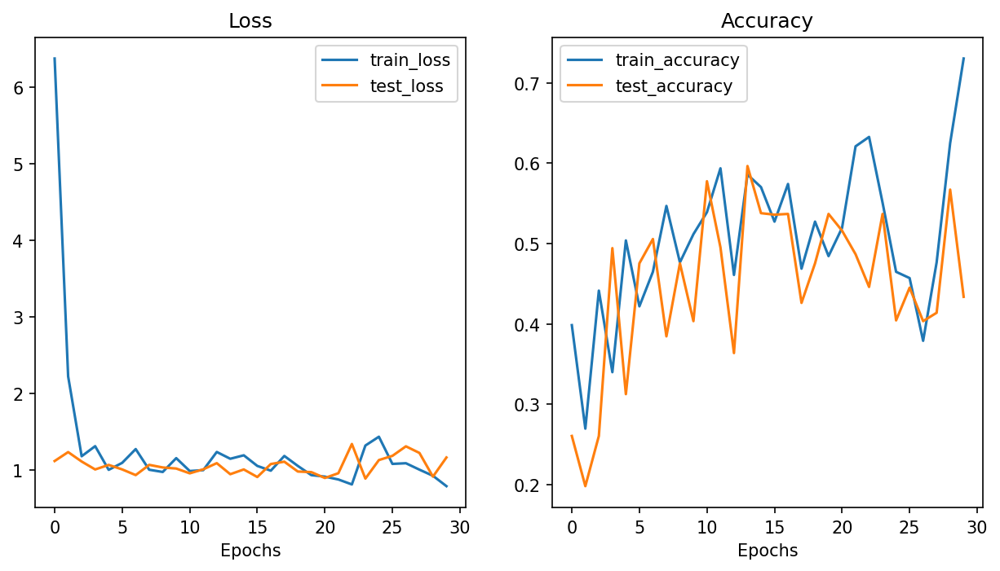

In [41]:
plt.figure(figsize=(10, 5), dpi=150)

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='train_loss')
plt.plot(epochs, test_loss,  label='test_loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='train_accuracy')
plt.plot(epochs, test_acc,  label='test_accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.legend()

plt.show()

<br>
<br>

# (Appendix 1) Predict on a new image

In [42]:
new_img_path = "data_food101/sample_pizza.jpg"

<class 'PIL.JpegImagePlugin.JpegImageFile'>
2048
2048


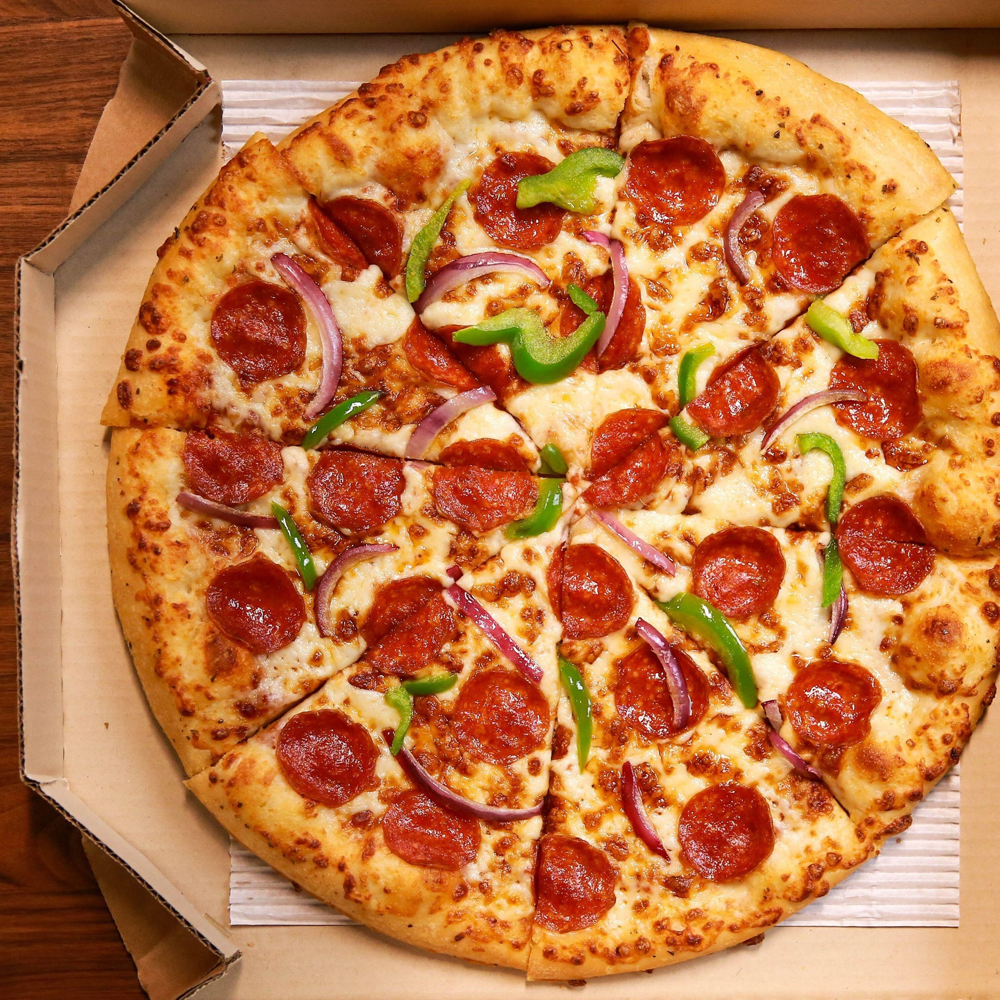

In [43]:
img = Image.open(new_img_path) # from PIL import Image

print(type(img))
print(img.height)
print(img.width)

img

In [44]:
img_tensor = torchvision.io.read_image(new_img_path) # "read" an "image" instead of [ ImageFolder & DataLoader ]

print(type(img_tensor))
print(img_tensor.shape)
print(img_tensor.dtype, '\n')

print(img_tensor)

<class 'torch.Tensor'>
torch.Size([3, 2048, 2048])
torch.uint8 

tensor([[[146, 141, 133,  ..., 124, 122, 123],
         [141, 141, 138,  ..., 124, 122, 122],
         [139, 143, 144,  ..., 126, 123, 122],
         ...,
         [ 88,  82,  80,  ..., 229, 227, 227],
         [ 83,  79,  78,  ..., 227, 227, 227],
         [ 77,  77,  76,  ..., 228, 229, 229]],

        [[ 64,  59,  53,  ...,  67,  65,  66],
         [ 59,  59,  58,  ...,  67,  65,  65],
         [ 57,  61,  65,  ...,  69,  66,  65],
         ...,
         [ 29,  23,  21,  ..., 173, 172, 173],
         [ 24,  20,  19,  ..., 172, 172, 172],
         [ 18,  18,  17,  ..., 173, 174, 174]],

        [[ 26,  21,  16,  ...,  24,  22,  23],
         [ 21,  21,  21,  ...,  24,  22,  22],
         [ 17,  21,  26,  ...,  26,  23,  22],
         ...,
         [ 11,   5,   3,  ..., 114, 115, 113],
         [  6,   2,   1,  ..., 115, 116, 115],
         [  0,   0,   0,  ..., 117, 118, 118]]], dtype=torch.uint8)


In [48]:
print(img_tensor.shape)

img_tensor_reshape = img_tensor.reshape(1, 3, 2048, 2048) # using "reshape" (<- [ 2048x2048 ] is not fixed)
print(img_tensor_reshape.shape)

img_tensor_unsqueeze = img_tensor.unsqueeze(dim=0) # using "unsqueeze" (preferable)
print(img_tensor_unsqueeze.shape)

torch.Size([3, 2048, 2048])
torch.Size([1, 3, 2048, 2048])
torch.Size([1, 3, 2048, 2048])


In [53]:
img_tensor = torchvision.io.read_image(new_img_path)

img_tensor = img_tensor / 255.0

img_tensor = img_tensor.unsqueeze(dim=0) # [Channels, Height, Width] -> [Batch_size, Channels, Height, Width]


img_transform_resize = transforms.Compose([ # 구성하다
    transforms.Resize((64, 64))
])

img_tensor_transformed = img_transform_resize(img_tensor)


model.eval()

with torch.inference_mode():
    img_logits = model(img_tensor_transformed.to(device))
    

print(img_logits)
print(img_logits.softmax(dim=1))
print(img_logits.softmax(dim=1).argmax(dim=1))

predicted_class = img_logits.softmax(dim=1).argmax(dim=1)

print(['pizza', 'steak', 'sushi'][predicted_class])

tensor([[ 0.6191, -2.4918,  0.8634]], device='mps:0')
tensor([[0.4308, 0.0192, 0.5500]], device='mps:0')
tensor([2], device='mps:0')
sushi


In [54]:
def predict_img(model, image_path, class_names, device):
    
    img_tensor = torchvision.io.read_image(image_path)
    
    img_tensor = img_tensor / 255.0

    img_tensor = img_tensor.unsqueeze(dim=0) # [Channels, Height, Width] -> [Batch_size, Channels, Height, Width]


    img_transform_resize = transforms.Compose([
        transforms.Resize((64, 64))
    ])

    img_tensor_transformed = img_transform_resize(img_tensor)


    model.to(device) # make sure the model should be on the same device
    model.eval()

    with torch.inference_mode():
        img_logits = model(img_tensor_transformed.to(device))

    
    predicted_prob = img_logits.softmax(dim=1).max(dim=1)[0].item()
    predicted_class = img_logits.softmax(dim=1).argmax(dim=1)
    predicted_class_name = class_names[predicted_class]
        
    
    plt.figure(figsize=(5, 5), dpi=150)
    plt.imshow(img_tensor.squeeze(dim=0).permute(1, 2, 0)) # [C, H, W] -> [H, W, C]
    
    title = "Pred: {} | Prob: {:.2f}%".format(predicted_class_name, predicted_prob * 100)
    plt.title(title)
    plt.axis(False)
    plt.show()

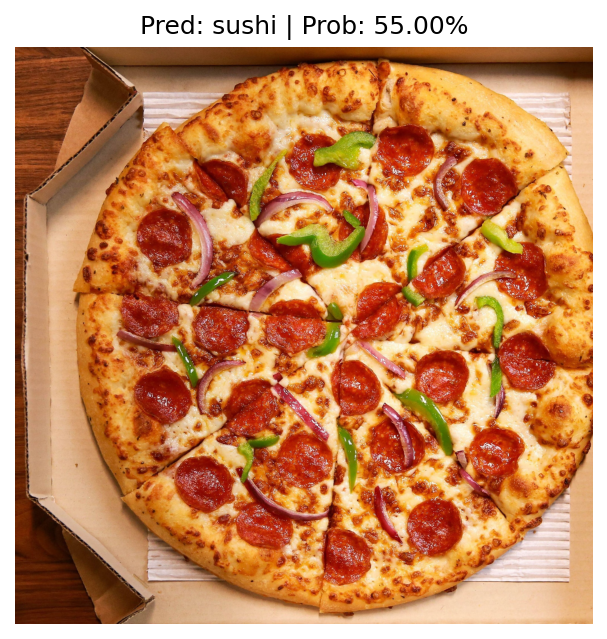

In [55]:
predict_img(model=model,
            image_path="data_food101/sample_pizza.jpg",
            class_names = ['pizza', 'steak', 'sushi'],
            device=device)

<br>
<br>

# (Appendix 2) Compare & save the results

In [57]:
import pickle

with open("model_result_CNN_1.pkl", 'rb') as f:
    model_results_old = pickle.load(f)

In [58]:
model_results_old

{'train_loss': [1.107836753129959,
  1.0845973119139671,
  1.1154548227787018,
  1.0983811616897583,
  1.0988675653934479,
  1.0956736654043198,
  1.1191744953393936,
  1.1025030612945557,
  1.0904605835676193,
  1.0700633972883224],
 'train_acc': [0.2578125,
  0.42578125,
  0.29296875,
  0.4140625,
  0.29296875,
  0.25390625,
  0.31640625,
  0.359375,
  0.47265625,
  0.40234375],
 'test_loss': [1.1362110376358032,
  1.1622593402862549,
  1.1694430510203044,
  1.134698510169983,
  1.1432352860768635,
  1.148198922475179,
  1.143027424812317,
  1.107139229774475,
  1.072399377822876,
  1.0222460826237996],
 'test_acc': [0.2604166666666667,
  0.19791666666666666,
  0.19791666666666666,
  0.19791666666666666,
  0.19791666666666666,
  0.2604166666666667,
  0.3229166666666667,
  0.19791666666666666,
  0.5416666666666666,
  0.5416666666666666]}

In [59]:
df_result_old = pd.DataFrame(model_results_old)

epochs = [ i+1 for i in range(len(df_result_old)) ]
df_result_old['epochs'] = epochs
df_result_old = df_result_old.set_index('epochs') # set the index column with the selected column

df_result_old

,train_loss,train_acc,test_loss,test_acc
epochs,,,,
1,1.107837,0.257812,1.136211,0.260417
2,1.084597,0.425781,1.162259,0.197917
3,1.115455,0.292969,1.169443,0.197917
4,1.098381,0.414062,1.134699,0.197917
5,1.098868,0.292969,1.143235,0.197917
6,1.095674,0.253906,1.148199,0.260417
7,1.119174,0.316406,1.143027,0.322917
8,1.102503,0.359375,1.107139,0.197917
9,1.090461,0.472656,1.072399,0.541667


In [60]:
df_result_new = pd.DataFrame(model_results)

epochs = [ i+1 for i in range(len(df_result_new)) ]
df_result_new['epochs'] = epochs
df_result_new = df_result_new.set_index('epochs')

df_result_new

,train_loss,train_acc,test_loss,test_acc
epochs,,,,
1,6.374274,0.398438,1.116745,0.260417
2,2.222413,0.269531,1.233423,0.197917
3,1.179255,0.441406,1.110218,0.260417
4,1.310825,0.339844,1.006667,0.494318
5,1.001528,0.503906,1.066020,0.312500
6,1.093119,0.421875,1.007005,0.475379
7,1.272867,0.464844,0.932989,0.505682
8,1.002909,0.546875,1.066690,0.384470
9,0.973738,0.476562,1.032730,0.475379


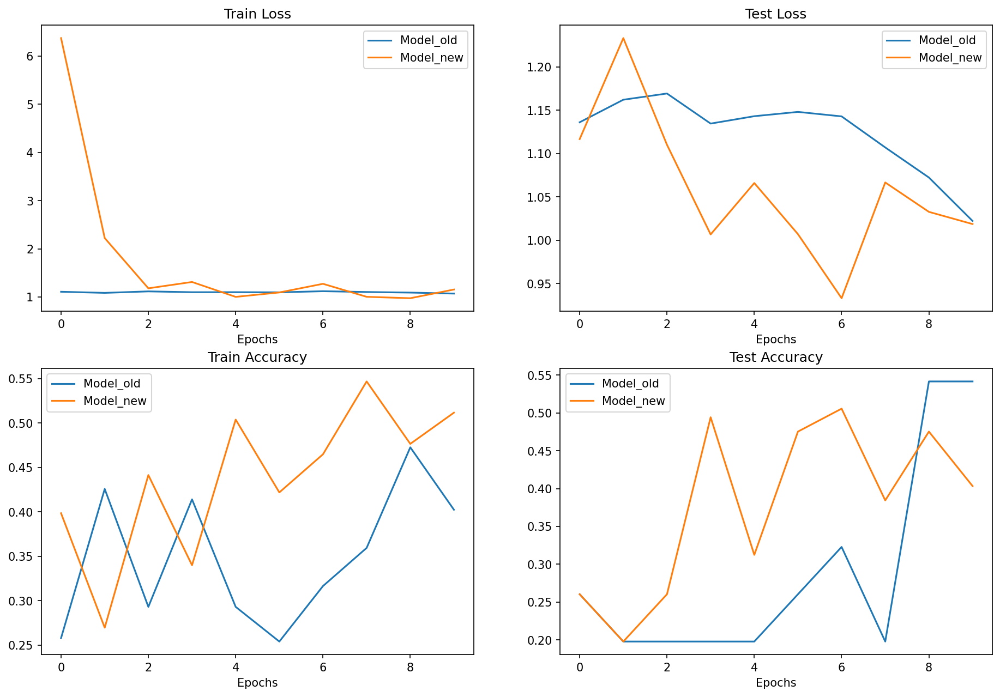

In [61]:
plt.figure(figsize=(15, 10), dpi=150)

epochs = list(range(len(df_result_old)))

plt.subplot(2, 2, 1)
plt.plot(epochs, df_result_old["train_loss"],      label="Model_old")
plt.plot(epochs, df_result_new["train_loss"][:10], label="Model_new")
plt.title("Train Loss")
plt.xlabel("Epochs")
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, df_result_old["test_loss"],      label="Model_old")
plt.plot(epochs, df_result_new["test_loss"][:10], label="Model_new")
plt.title("Test Loss")
plt.xlabel("Epochs")
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, df_result_old["train_acc"],      label="Model_old")
plt.plot(epochs, df_result_new["train_acc"][:10], label="Model_new")
plt.title("Train Accuracy")
plt.xlabel("Epochs")
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, df_result_old["test_acc"],      label="Model_old")
plt.plot(epochs, df_result_new["test_acc"][:10], label="Model_new")
plt.title("Test Accuracy")
plt.xlabel("Epochs")
plt.legend()

plt.show()

<br>

### -> Here comes the "**Transfer-learning**" soon.

<br>

In [62]:
import pickle

with open('model_result_CNN_2.pkl', 'wb') as f:
    pickle.dump(model_results, f)